<a href="https://colab.research.google.com/github/ruslanakbar/LaneDetection/blob/main/HW1_KITTI_Ruslan_A.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

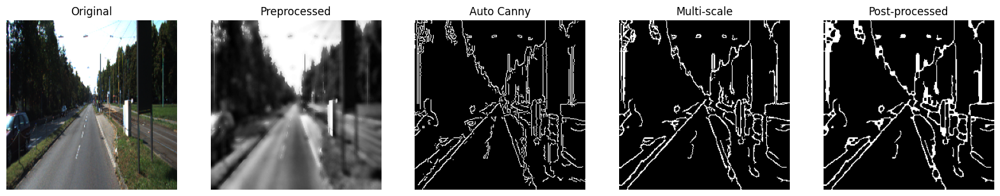

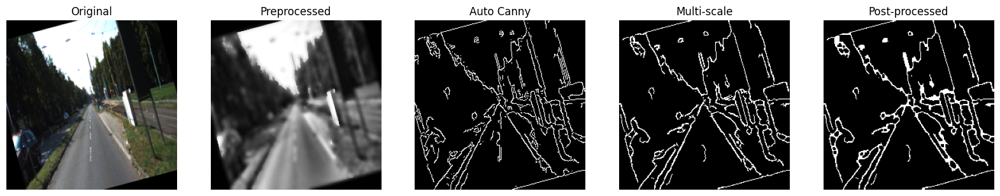

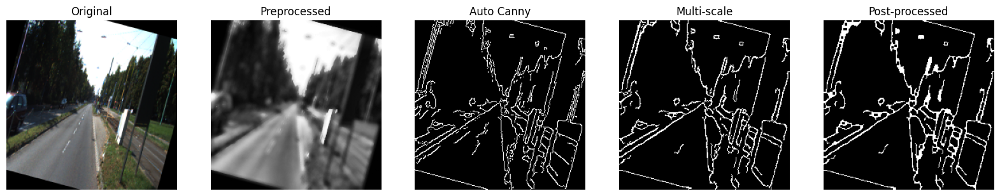

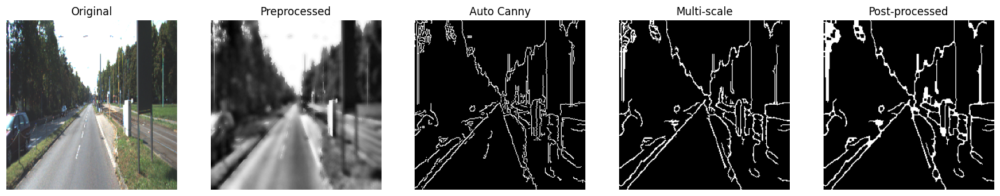

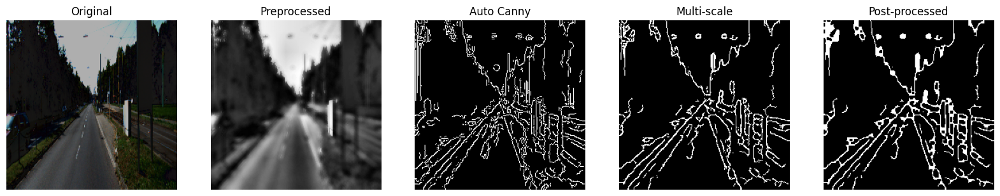

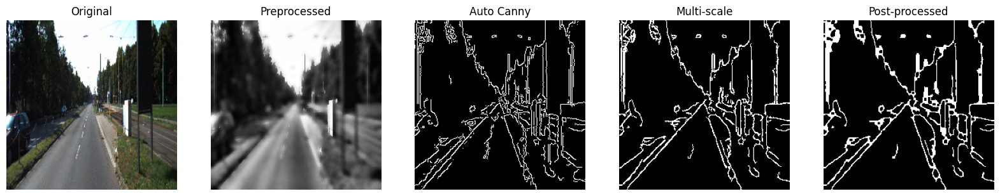

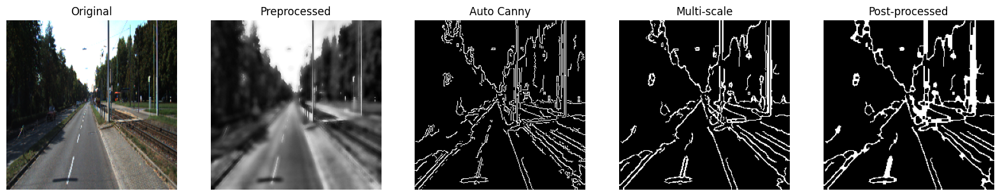

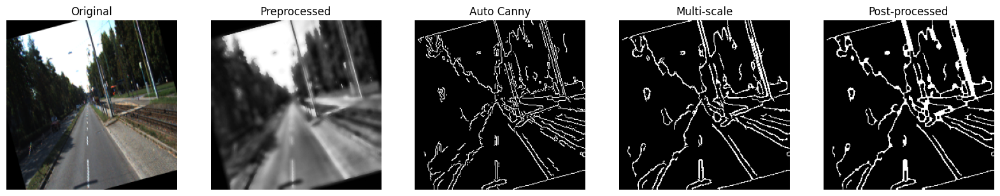

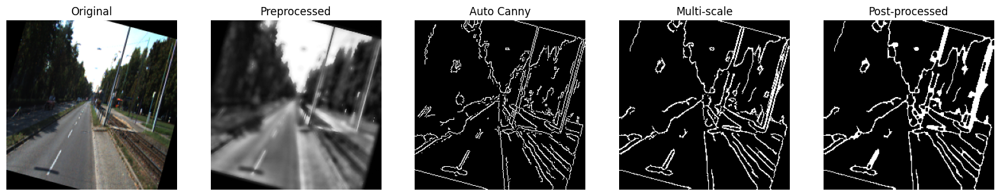

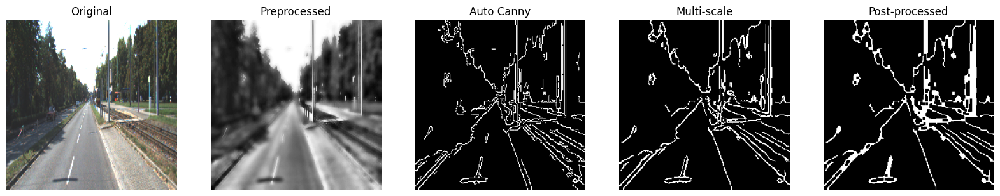

interactive(children=(IntSlider(value=100, description='low', max=255), IntSlider(value=143, description='high…

<function __main__.tune(low=100, high=143)>

In [ ]:
##INSTALL LIBRARIES
!pip install -q opencv-python-headless ipywidgets

import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import os
from ipywidgets import interact

# ─── 2) CONFIG ────────────────────────────────────────────────────────────────────
IMAGE_DIR      = '/content/processed_data_road/testing/images'  # adjust if needed
NUM_SAMPLES    = 10

# Pre-processing
BILATERAL_D    = 9
BILATERAL_SC   = 75
BILATERAL_SS   = 75
CLAHE_CLIP     = 2.0
CLAHE_GRID     = (8, 8)

# Multi-scale Canny
SCALES         = [(3, 3, 1.0), (5, 5, 1.5), (7, 7, 2.0)]
SIGMA          = 0.33

# Post-processing
CLOSE_KSIZE    = 3


# ─── 3) FUNCTIONS ─────────────────────────────────────────────────────────────────
def preprocess(gray):
    """Denoise + contrast‐enhance."""
    den = cv2.bilateralFilter(gray, d=BILATERAL_D, sigmaColor=BILATERAL_SC, sigmaSpace=BILATERAL_SS)
    clahe = cv2.createCLAHE(clipLimit=CLAHE_CLIP, tileGridSize=CLAHE_GRID)
    return clahe.apply(den)

def auto_canny(img, sigma=SIGMA):
    """Compute lower/upper from median and run Canny."""
    v = np.median(img)
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    return cv2.Canny(img, lower, upper)

def multi_scale_canny(img, scales=SCALES, sigma=SIGMA):
    """Run Canny at different blur scales and OR‐fuse."""
    maps = []
    for kx, ky, sig in scales:
        b = cv2.GaussianBlur(img, (kx, ky), sig)
        maps.append(auto_canny(b, sigma))
    return np.bitwise_or.reduce(maps)

def post_process(edges, ksize=CLOSE_KSIZE):
    """Morphological closing to bridge gaps."""
    k = cv2.getStructuringElement(cv2.MORPH_RECT, (ksize, ksize))
    return cv2.morphologyEx(edges, cv2.MORPH_CLOSE, k)

def show_results(orig, pre, c1, c2, post):
    fig, ax = plt.subplots(1,5, figsize=(20,4))
    ax[0].imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB));     ax[0].set_title('Original');      ax[0].axis('off')
    ax[1].imshow(pre, cmap='gray');                         ax[1].set_title('Preprocessed');  ax[1].axis('off')
    ax[2].imshow(c1, cmap='gray');                          ax[2].set_title('Auto Canny');    ax[2].axis('off')
    ax[3].imshow(c2, cmap='gray');                          ax[3].set_title('Multi-scale');    ax[3].axis('off')
    ax[4].imshow(post, cmap='gray');                        ax[4].set_title('Post-processed');ax[4].axis('off')
    plt.show()


# ─── 4) LOAD & RUN ON A BATCH ─────────────────────────────────────────────────────
paths = sorted(glob(os.path.join(IMAGE_DIR, '*.png')))[:NUM_SAMPLES]

for p in paths:
    img  = cv2.imread(p)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    pre  = preprocess(gray)
    c1   = auto_canny(pre)
    c2   = multi_scale_canny(pre)
    post = post_process(c2)
    show_results(img, pre, c1, c2, post)


# ─── 5) INTERACTIVE TUNER (FIRST SAMPLE) ───────────────────────────────────────────
# Drag the sliders to see how low/high affect edges on the first image.
sample = cv2.imread(paths[0])
g = cv2.cvtColor(sample, cv2.COLOR_BGR2GRAY)
p = preprocess(g)

def tune(low=100, high=143):
    e = cv2.Canny(p, low, high)
    plt.figure(figsize=(6,6))
    plt.imshow(e, cmap='gray')
    plt.title(f'Low={low}  High={high}')
    plt.axis('off')
    plt.show()

interact(tune,
         low=(0, 255, 1),      #  min, max, step
         high=(0, 255, 1))     #  min, max, step


In [3]:
import cv2
import os
import numpy as np
from glob import glob
import shutil

# Paths
mask_folder = '/content/dataset/data_road/training/gt_image_2'
image_folder = '/content/dataset/data_road/training/image_2'
output_base = '/content/KITTI_classified'

# Threshold for % of magenta pixels
PIXEL_THRESHOLD = 0.01  # 1% of image

# Create folders
lane_dir = os.path.join(output_base, 'lane')
nolane_dir = os.path.join(output_base, 'nolane')
os.makedirs(lane_dir, exist_ok=True)
os.makedirs(nolane_dir, exist_ok=True)

# Process all masks
for mask_path in glob(os.path.join(mask_folder, '*.png')):
    mask = cv2.imread(mask_path)

    # Count magenta pixels
    magenta_pixels = np.sum(np.all(mask == [255, 0, 255], axis=-1))
    total_pixels = mask.shape[0] * mask.shape[1]
    magenta_ratio = magenta_pixels / total_pixels

    # Get corresponding image path
    fname = os.path.basename(mask_path).replace('_road_', '_')
    image_path = os.path.join(image_folder, fname)

    if not os.path.exists(image_path):
        continue  # skip if original image is missing

    if magenta_ratio > PIXEL_THRESHOLD:
        shutil.copy(image_path, os.path.join(lane_dir, fname))
    else:
        shutil.copy(image_path, os.path.join(nolane_dir, fname))

print(" Images sorted into 'lane/' and 'nolane/' based on mask coverage.")


✅ Images sorted into 'lane/' and 'nolane/' based on mask coverage.


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dataset extracted to /content/dataset
Images resized successfully.


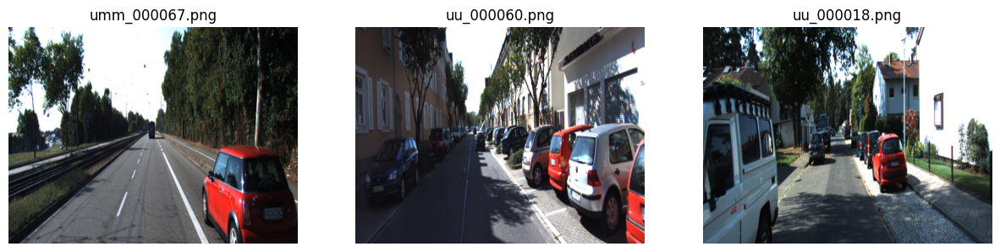

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.6' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Augmentation completed.


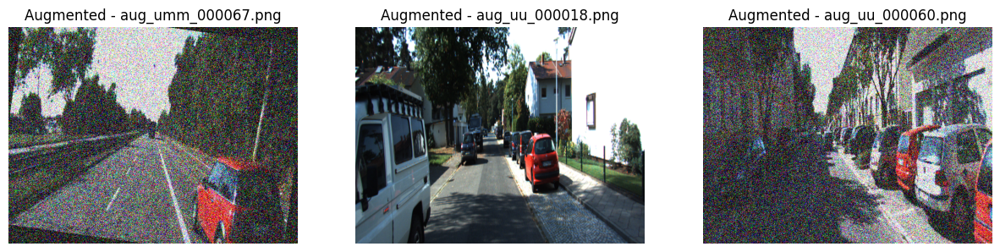

Dataset splitting completed.
Training set: 202 images
Validation set: 43 images
Testing set: 44 images


In [ ]:
# Step 1: Mount your Google Drive
from google.colab import drive
drive.mount('/content/drive')
# Step 2: Unzip dataset
import zipfile
import os

zip_path = '/content/drive/MyDrive/data_road.zip' # Update if path differs
extract_to = '/content/dataset'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f'Dataset extracted to {extract_to}')
# Step 3: Resize images
import cv2
from glob import glob

def resize_images(src_folder, dst_folder, size=(640,480)):
    os.makedirs(dst_folder, exist_ok=True)
    for img_path in glob(os.path.join(src_folder, '*.png')):
        img = cv2.imread(img_path)
        resized = cv2.resize(img, size)
        cv2.imwrite(os.path.join(dst_folder, os.path.basename(img_path)), resized)

resize_images('/content/dataset/data_road/training/image_2', '/content/resized/train')
resize_images('/content/dataset/data_road/testing/image_2', '/content/resized/test')
print("Images resized successfully.")
# Step 4: Visualize some resized images
import matplotlib.pyplot as plt
import random

sample_images = random.sample(glob('/content/resized/train/*.png'), 3)

plt.figure(figsize=(15, 5))
for i, img_path in enumerate(sample_images):
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    plt.subplot(1,3,i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(os.path.basename(img_path))

plt.show()
# Step 5: Augment images using Albumentations
!pip install albumentations

import albumentations as A

augmentations = A.Compose([
    A.Rotate(limit=10, p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.GaussNoise(p=0.3)
])

augmented_path = '/content/augmented_images'
os.makedirs(augmented_path, exist_ok=True)

for img_path in sample_images:
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    augmented_img = augmentations(image=img)['image']
    augmented_img = cv2.cvtColor(augmented_img, cv2.COLOR_RGB2BGR)
    save_path = os.path.join(augmented_path, 'aug_' + os.path.basename(img_path))
    cv2.imwrite(save_path, augmented_img)

print("Augmentation completed.")
# Step 6: Visualize augmented images
augmented_images = glob('/content/augmented_images/*.png')

plt.figure(figsize=(15,5))
for i, img_path in enumerate(augmented_images):
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    plt.subplot(1,3,i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title('Augmented - ' + os.path.basename(img_path))

plt.show()
# Step 7: Split dataset into train(70%), val(15%), test(15%)
from sklearn.model_selection import train_test_split
import shutil

all_images = glob('/content/resized/train/*.png')
train, val_test = train_test_split(all_images, test_size=0.3, random_state=42)
val, test = train_test_split(val_test, test_size=0.5, random_state=42)

def move_files(files, destination):
    os.makedirs(destination, exist_ok=True)
    for file in files:
        shutil.copy(file, destination)

base_dir = '/content/final_dataset'
move_files(train, os.path.join(base_dir, 'train'))
move_files(val, os.path.join(base_dir, 'val'))
move_files(test, os.path.join(base_dir, 'test'))

print("Dataset splitting completed.")
print(f"Training set: {len(train)} images")
print(f"Validation set: {len(val)} images")
print(f"Testing set: {len(test)} images")


In [ ]:
import os, shutil
from glob import glob

base_dir = '/content/drive/MyDrive/KITTI_prepared_dataset'

for split in ['train', 'val', 'test']:
    lane_folder = os.path.join(base_dir, split, 'lane')
    os.makedirs(lane_folder, exist_ok=True)
    images = glob(os.path.join(base_dir, split, '*.png'))
    for img in images:
        shutil.move(img, lane_folder)
print(" Dataset structure fixed.")


✅ Dataset structure fixed.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
import matplotlib.pyplot as plt
import os
from glob import glob
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# Adjust path if needed
base_dir = '/content/drive/MyDrive/KITTI_prepared_dataset'

img_height, img_width = 128, 128  # Smaller size for quick training
batch_size = 16

train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    base_dir+'/train',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    shuffle=True)

validation_generator = val_datagen.flow_from_directory(
    base_dir+'/val',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False)

test_generator = test_datagen.flow_from_directory(
    base_dir+'/test',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False)


#BaseLin model CNN
model = models.Sequential([
    layers.Conv2D(32, (3,3), activation='relu', input_shape=(img_height,img_width,3)),
    layers.MaxPooling2D(2,2),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D(2,2),
    layers.Conv2D(128, (3,3), activation='relu'),
    layers.MaxPooling2D(2,2),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.summary()


#Train The CNN model
history = model.fit(
    train_generator,
    epochs=10,  # Adjust epochs if short on time
    validation_data=validation_generator
)

#===============#Evaluating the metrics===================

# Predictions
test_generator.reset()
preds = model.predict(test_generator)
pred_labels = (preds > 0.5).astype(int)

# True labels (assuming all ones if only one class present, adapt accordingly)
true_labels = test_generator.classes

# Metrics
print("Classification Report:")
print(classification_report(true_labels, pred_labels))

accuracy = accuracy_score(true_labels, pred_labels)
precision = precision_score(true_labels, pred_labels, zero_division=1)
recall = recall_score(true_labels, pred_labels, zero_division=1)

print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")



Mounted at /content/drive
Found 233 images belonging to 2 classes.
Found 50 images belonging to 2 classes.
Found 51 images belonging to 2 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │     1,605,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,699,009 (6.48 MB)

 Trainable params: 1,699,009 (6.48 MB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 57s 4s/step - accuracy: 0.7907 - loss: 0.5301 - val_accuracy: 0.8600 - val_loss: 0.2982
Epoch 2/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 271ms/step - accuracy: 0.8805 - loss: 0.2605 - val_accuracy: 0.9600 - val_loss: 0.1902
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 268ms/step - accuracy: 0.9410 - loss: 0.1713 - val_accuracy: 0.9800 - val_loss: 0.1019
Epoch 4/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 271ms/step - accuracy: 0.9950 - loss: 0.0606 - val_accuracy: 0.9800 - val_loss: 0.0387
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 269ms/step - accuracy: 0.9727 - loss: 0.0734 - val_accuracy: 0.9600 - val_loss: 0.1085
Epoch 6/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 270ms/step - accuracy: 0.9977 - loss: 0.0242 - val_accuracy: 0.9800 - val_loss: 0.0440
Epoch 7/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 270ms/step - accuracy: 1.0000 - loss: 0.0068 - val_accuracy: 0.9800 - val_loss: 0.0271
Epoch 8/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 268ms/step - accuracy: 1.0000 - loss: 0.0054 - val_accuracy: 0.98

Found 51 images belonging to 2 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        44
           1       1.00      1.00      1.00         7

    accuracy                           1.00        51
   macro avg       1.00      1.00      1.00        51
weighted avg       1.00      1.00      1.00        51

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


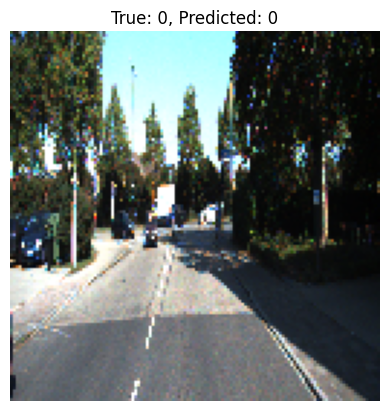

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


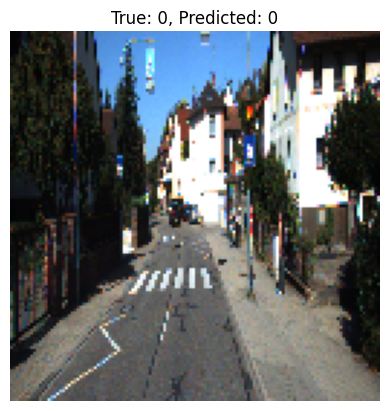

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


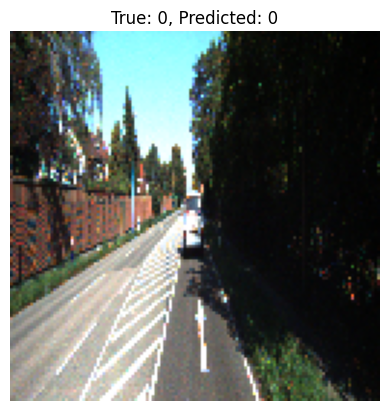

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


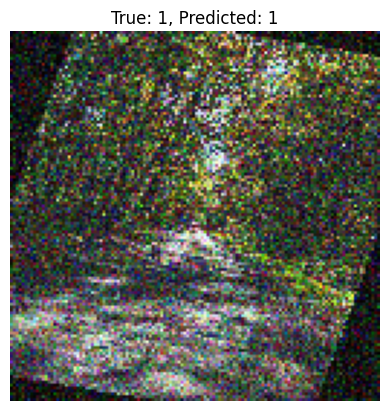

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


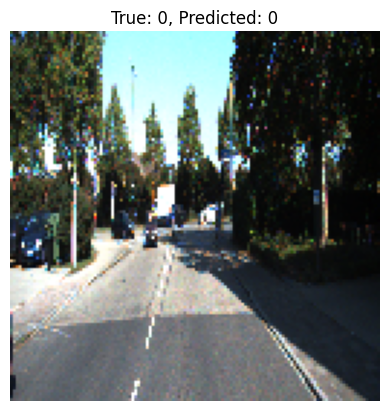

✅ Model saved to Drive.


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

data_dir = '/content/drive/MyDrive/KITTI_prepared_dataset'
img_height, img_width = 128, 128
batch_size = 16

test_datagen = ImageDataGenerator(rescale=1./255)

test_gen = test_datagen.flow_from_directory(
    data_dir + '/test',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False
)
from sklearn.metrics import classification_report

test_gen.reset()
preds = (model.predict(test_gen) > 0.5).astype(int)
true_labels = test_gen.classes

print(classification_report(true_labels, preds))
import matplotlib.pyplot as plt

test_gen.reset()
for i in range(5):
    img, label = next(test_gen)
    prediction = model.predict(img)[0]
    predicted_class = int(prediction[0] > 0.5)

    plt.imshow(img[0])
    plt.title(f"True: {int(label[0])}, Predicted: {predicted_class}")
    plt.axis('off')
    plt.show()


model.save('/content/drive/MyDrive/lane_classifier_model.h5')
print(" Model saved to Drive.")


In [ ]:
###prepare dataset for the application for LANE SEGMENTATION
from google.colab import drive
drive.mount('/content/drive')

# Step 1: Unzip
!unzip -q "/content/drive/MyDrive/data_road.zip" -d /content/dataset
print("✅ Unzipped")
import os
import cv2
import numpy as np
from glob import glob
import albumentations as A

image_dir = '/content/dataset/data_road/training/image_2'
mask_dir = '/content/dataset/data_road/training/gt_image_2'

output_img_dir = '/content/processed_lanenet/train/images'
output_mask_dir = '/content/processed_lanenet/train/masks'
os.makedirs(output_img_dir, exist_ok=True)
os.makedirs(output_mask_dir, exist_ok=True)

# Define augmentations
augment = A.Compose([
    A.Resize(256, 256),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.Rotate(limit=10, p=0.5),
    A.GaussNoise(p=0.3)
])

count = 0
image_paths = sorted(glob(os.path.join(image_dir, '*.png')))
for img_path in image_paths:
    base_name = os.path.basename(img_path)
    mask_name = base_name.replace('_', '_road_')
    mask_path = os.path.join(mask_dir, mask_name)

    if not os.path.exists(mask_path):
        continue

    image = cv2.imread(img_path)
    mask = cv2.imread(mask_path)

    # Create binary mask where magenta (255, 0, 255) = 1
    binary_mask = np.all(mask == [255, 0, 255], axis=-1).astype(np.uint8)

    # Apply augmentations 3x per image
    for i in range(3):
        aug = augment(image=image, mask=binary_mask)
        aug_img = aug['image']
        aug_mask = aug['mask'] * 255  # back to 0/255 for saving

        cv2.imwrite(os.path.join(output_img_dir, f'{count:04d}.png'), aug_img)
        cv2.imwrite(os.path.join(output_mask_dir, f'{count:04d}.png'), aug_mask)
        count += 1

print(f" Done: {count} image-mask pairs saved.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Unzipped


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.6' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


✅ Done: 867 image-mask pairs saved.


In [ ]:
###LANENET STYLE Training pipeline

import tensorflow as tf
import numpy as np
import os
import cv2
from glob import glob
from tensorflow.keras.utils import Sequence

# Paths
image_dir = "/content/processed_lanenet/train/images"
mask_dir = "/content/processed_lanenet/train/masks"
img_size = (256, 256)
batch_size = 8
class LaneDataset(Sequence):
    def __init__(self, image_paths, mask_paths, batch_size, img_size):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.batch_size = batch_size
        self.img_size = img_size

    def __len__(self):
        return len(self.image_paths) // self.batch_size

    def __getitem__(self, idx):
        batch_x = self.image_paths[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.mask_paths[idx * self.batch_size:(idx + 1) * self.batch_size]

        imgs = []
        masks = []

        for x, y in zip(batch_x, batch_y):
            img = cv2.imread(x)
            img = cv2.resize(img, self.img_size)
            img = img / 255.0

            mask = cv2.imread(y, cv2.IMREAD_GRAYSCALE)
            mask = cv2.resize(mask, self.img_size)
            mask = (mask > 127).astype(np.float32)

            imgs.append(img)
            masks.append(mask[..., np.newaxis])

        return np.array(imgs), np.array(masks)

# Load paths
image_paths = sorted(glob(os.path.join(image_dir, "*.png")))
mask_paths = sorted(glob(os.path.join(mask_dir, "*.png")))

# Shuffle and split (80% train / 20% val)
split_idx = int(0.8 * len(image_paths))
train_gen = LaneDataset(image_paths[:split_idx], mask_paths[:split_idx], batch_size, img_size)
val_gen = LaneDataset(image_paths[split_idx:], mask_paths[split_idx:], batch_size, img_size)
from tensorflow.keras import layers, models

def build_unet(input_shape):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    c1 = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(32, 3, activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D()(c1)

    c2 = layers.Conv2D(64, 3, activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(64, 3, activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D()(c2)

    # Bottleneck
    b1 = layers.Conv2D(128, 3, activation='relu', padding='same')(p2)
    b1 = layers.Conv2D(128, 3, activation='relu', padding='same')(b1)

    # Decoder
    u2 = layers.UpSampling2D()(b1)
    u2 = layers.Concatenate()([u2, c2])
    c3 = layers.Conv2D(64, 3, activation='relu', padding='same')(u2)
    c3 = layers.Conv2D(64, 3, activation='relu', padding='same')(c3)

    u1 = layers.UpSampling2D()(c3)
    u1 = layers.Concatenate()([u1, c1])
    c4 = layers.Conv2D(32, 3, activation='relu', padding='same')(u1)
    c4 = layers.Conv2D(32, 3, activation='relu', padding='same')(c4)

    outputs = layers.Conv2D(1, 1, activation='sigmoid')(c4)

    model = models.Model(inputs, outputs)
    return model

model = build_unet((256, 256, 3))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=10
)


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_14 (Conv2D)  │ (None, 256, 256,  │        896 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 256, 256,  │      9,248 │ conv2d_14[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 128, 128,  │          0 │ conv2d_15[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 128, 128,  │     18,496 │ max_pooling2d_5[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_17 (Conv2D)  │ (None, 128, 128,  │     36,928 │ conv2d_16[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_6     │ (None, 64, 64,    │          0 │ conv2d_17[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_6[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 64, 64,    │    147,584 │ conv2d_18[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_2     │ (None, 128, 128,  │          0 │ conv2d_19[0][0]   │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 128, 128,  │          0 │ up_sampling2d_2[… │
│ (Concatenate)       │ 192)              │            │ conv2d_17[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 128, 128,  │    110,656 │ concatenate_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 128, 128,  │     36,928 │ conv2d_20[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_3     │ (None, 256, 256,  │          0 │ conv2d_21[0][0]   │
│ (UpSampling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 256, 256,  │          0 │ up_sampling2d_3[… │
│ (Concatenate)       │ 96)               │            │ conv2d_15[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 256, 256,  │     27,680 │ concatenate_3[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 256, 256,  │      9,248 │ conv2d_22[0][0] 

 Total params: 471,553 (1.80 MB)

 Trainable params: 471,553 (1.80 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 22s 104ms/step - accuracy: 0.8006 - loss: 0.4968 - val_accuracy: 0.8709 - val_loss: 0.3341
Epoch 2/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - accuracy: 0.8122 - loss: 0.3641 - val_accuracy: 0.8709 - val_loss: 0.2938
Epoch 3/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.8278 - loss: 0.3249 - val_accuracy: 0.8616 - val_loss: 0.3044
Epoch 4/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - accuracy: 0.8714 - loss: 0.2908 - val_accuracy: 0.8786 - val_loss: 0.2986
Epoch 5/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - accuracy: 0.9015 - loss: 0.2408 - val_accuracy: 0.8551 - val_loss: 0.3510
Epoch 6/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - accuracy: 0.9046 - loss: 0.2430 - val_accuracy: 0.9022 - val_loss: 0.2350
Epoch 7/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - accuracy: 0.9113 - loss: 0.2199 - val_accuracy: 0.9046 - val_loss: 0.2212
Epoch 8/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - accuracy: 0.9164 - loss: 0.2039 - val_accuracy: 0.9056 -

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


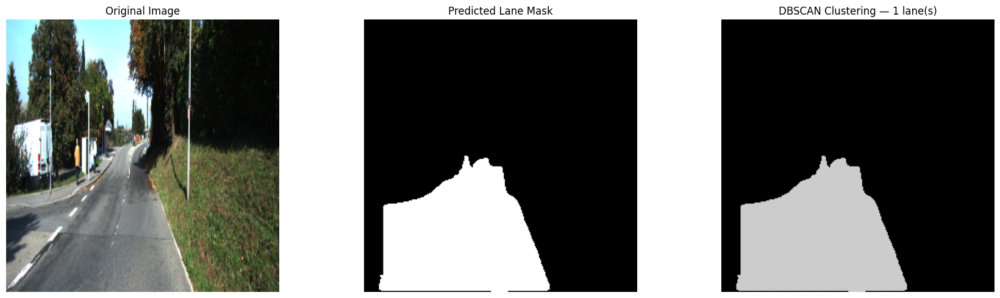

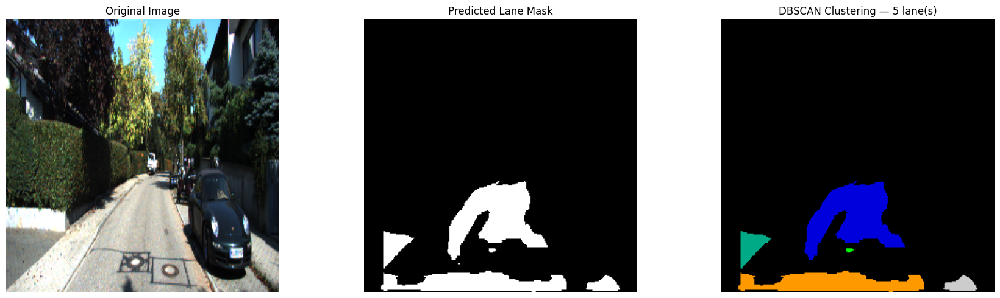

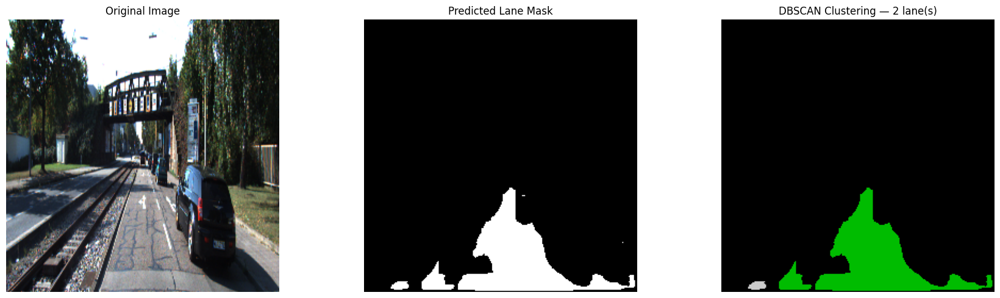

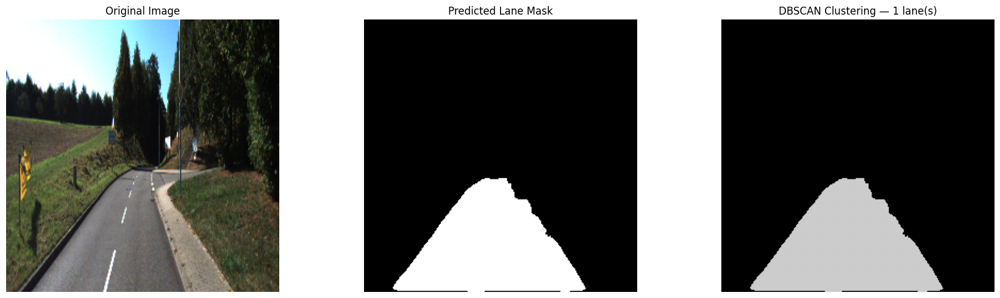

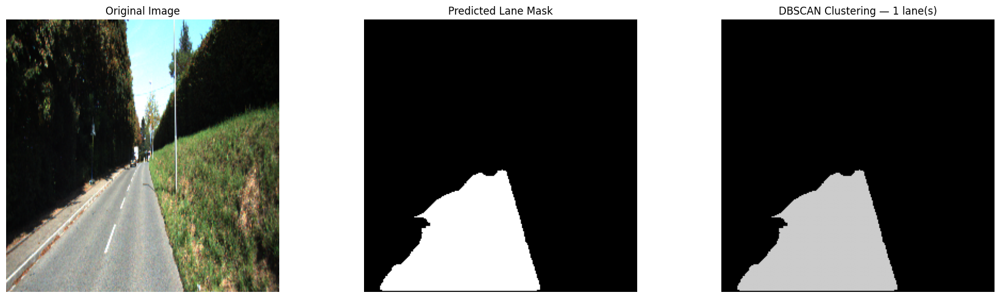

Non-zero pixels in mask: 10604


In [ ]:
###3Testing of the Created Image now
import matplotlib.pyplot as plt
import cv2
import numpy as np
from glob import glob
import random

test_image_dir = "/content/dataset/data_road/testing/image_2"
test_images = sorted(glob(f"{test_image_dir}/*.png"))
selected_images = random.sample(test_images, 5)
predicted_masks = []

for path in selected_images:
    img = cv2.imread(path)
    resized = cv2.resize(img, (256, 256))
    norm = resized / 255.0
    input_tensor = np.expand_dims(norm, axis=0)

    pred = model.predict(input_tensor)[0, :, :, 0]
    bin_mask = (pred > 0.5).astype(np.uint8)  # Binary mask

    predicted_masks.append((resized, bin_mask))
from sklearn.cluster import DBSCAN

def apply_dbscan(mask, eps=4, min_samples=10):
    coords = np.column_stack(np.where(mask == 1))
    if len(coords) == 0:
        return np.zeros_like(mask), 0

    clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(coords)
    labels = clustering.labels_
    clustered = np.zeros_like(mask)

    for label in np.unique(labels):
        if label == -1: continue  # skip noise
        clustered_mask = (labels == label)
        coords_label = coords[clustered_mask]
        for y, x in coords_label:
            clustered[y, x] = (label + 1) * (255 // (np.max(labels) + 1))

    return clustered, np.max(labels) + 1
for i, (img, mask) in enumerate(predicted_masks):
    clustered_mask, num_lanes = apply_dbscan(mask)

    fig, ax = plt.subplots(1, 3, figsize=(18, 5))
    ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax[0].set_title("Original Image")

    ax[1].imshow(mask, cmap='gray')
    ax[1].set_title("Predicted Lane Mask")

    ax[2].imshow(clustered_mask, cmap='nipy_spectral')
    ax[2].set_title(f"DBSCAN Clustering — {num_lanes} lane(s)")

    for a in ax:
        a.axis('off')

    plt.tight_layout()
    plt.show()
print(f"Non-zero pixels in mask: {np.sum(mask)}")



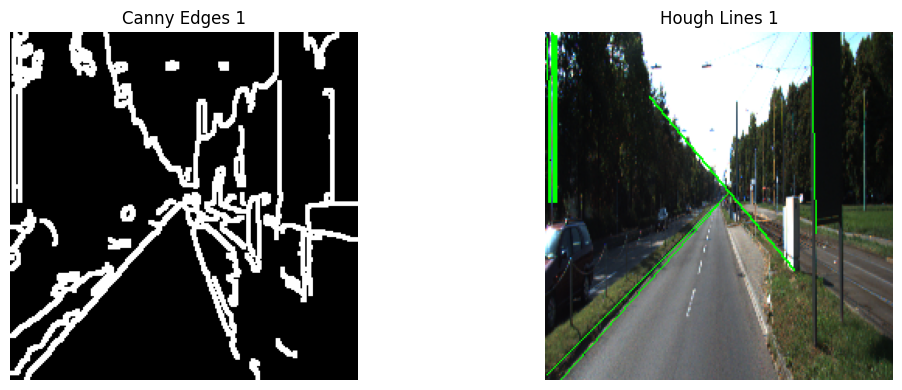

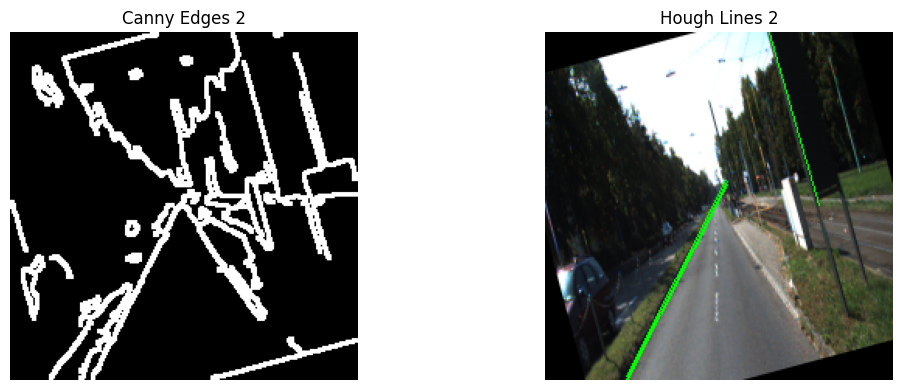

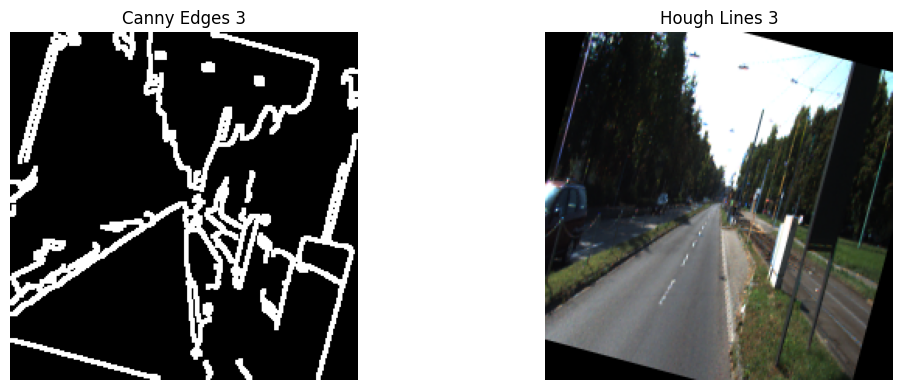

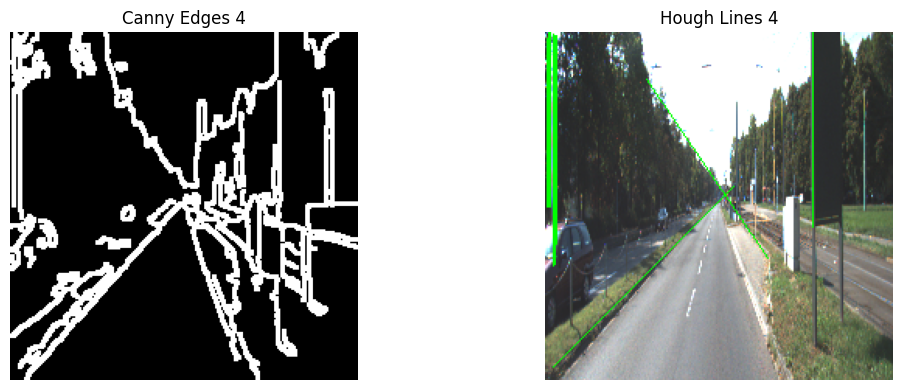

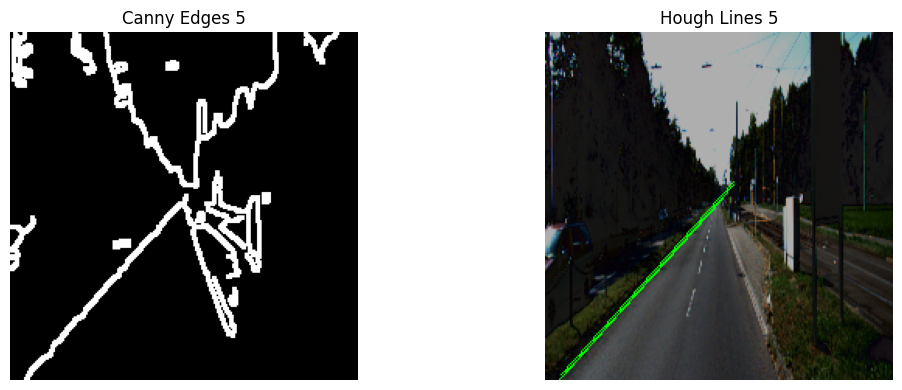

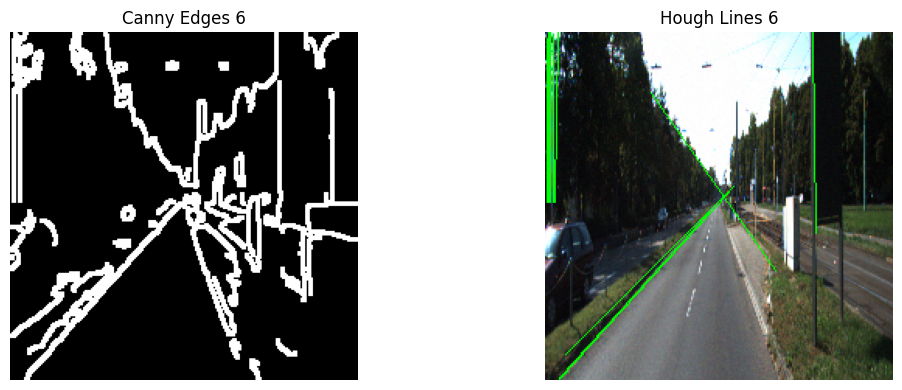

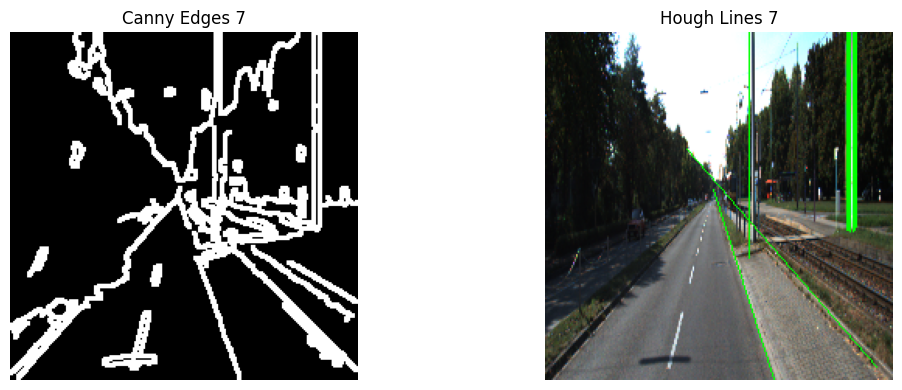

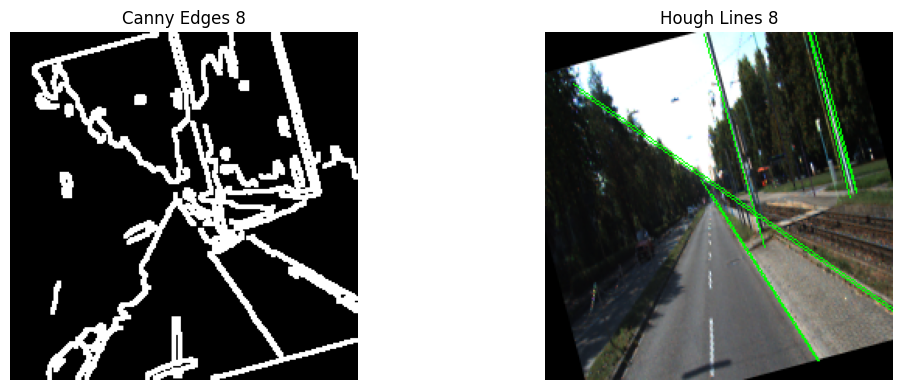

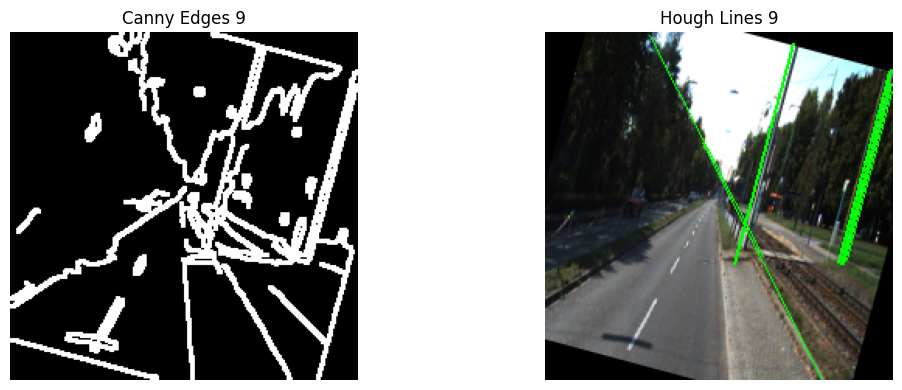

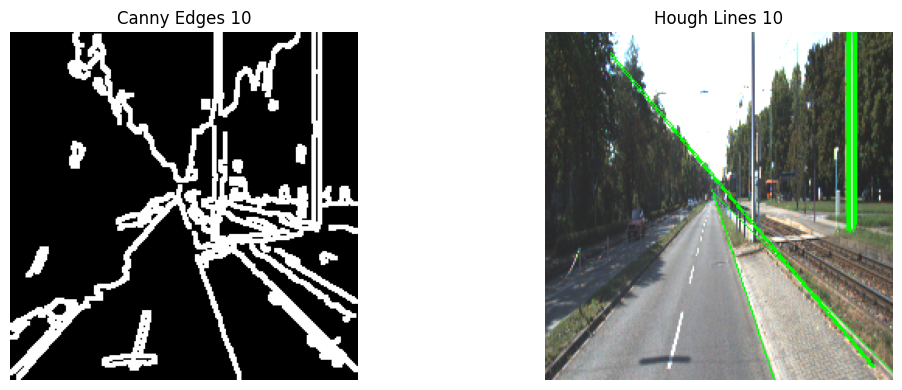

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
from glob import glob

# Paths
test_image_dir = '/content/processed_data_road/testing/images'
image_paths = sorted(glob(os.path.join(test_image_dir, '*.png')))[:10]  # First 10 images

# Parameters
low_threshold = 60
high_threshold = 140
blur_kernel = (5, 5)
blur_sigma = 1.5
dilate_kernel = np.ones((3, 3), np.uint8)

# Hough parameters
rho = 1
theta = np.pi / 180
threshold = 100
min_line_length = 100
max_line_gap = 8

# Process and display
for i, path in enumerate(image_paths):
    img = cv2.imread(path)
    if img is None:
        print(f"⚠️ Skipping unreadable image: {path}")
        continue

    # Preprocessing: grayscale + blur
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, blur_kernel, blur_sigma)

    # Canny edge detection
    edges = cv2.Canny(blurred, low_threshold, high_threshold)

    # Dilation to strengthen edges (optional)
    dilated_edges = cv2.dilate(edges, dilate_kernel, iterations=1)

    # Hough Transform
    lines = cv2.HoughLinesP(dilated_edges, rho, theta, threshold,
                            minLineLength=min_line_length,
                            maxLineGap=max_line_gap)

    # Draw lines on a copy of the original image
    line_img = img.copy()
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            angle = np.abs(np.arctan2((y2 - y1), (x2 - x1)) * 180.0 / np.pi)
            if 35 < angle < 145:  # avoid vertical poles & horizontal junk
                cv2.line(line_img, (x1, y1), (x2, y2), (0, 255, 0), 1)

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(dilated_edges, cmap='gray')
    plt.title(f'Canny Edges {i+1}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(line_img, cv2.COLOR_BGR2RGB))
    plt.title(f'Hough Lines {i+1}')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

